# Tree Ring Analysis Polar Transformation

Author: Johnny Esteves, University Of Michigan

### Description
Here we plot the results of the tree ring analysis

In [1]:
%reset -f
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
plt.rc('image', interpolation='bicubic', origin='lower', cmap = 'viridis')
plt.rcParams["axes.formatter.useoffset"] = False
plt.rcParams['figure.figsize'] = [14.0, 10.0]
plt.rcParams['font.size'] = 16
rcParams = plt.rcParams.copy()


import posixpath, datetime, sys
import cv2

from scipy.stats import binned_statistic_2d, binned_statistic
from skimage.measure import block_reduce
from skimage.util import view_as_blocks
from scipy.ndimage.filters import gaussian_filter
import scipy.optimize as opt

In [2]:

from mpl_toolkits.axes_grid1 import make_axes_locatable

def colorbar(obj=None, ax=None, size="5%", pad=0.1):
    should_restore = False

    if obj is not None:
        ax = obj.axes
    elif ax is None:
        ax = plt.gca()
        should_restore = True

    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size=size, pad=pad)

    plt.colorbar(obj, cax=cax)

    if should_restore:
        plt.sca(ax)
        
def imshow2(image, qq=[0.5,97.5], show_colorbar=True, **kwargs):
    vmin1,vmax1 = np.percentile(image[np.isfinite(image)], qq)
    if 'vmin' not in kwargs.keys():
        kwargs['vmin'] = vmin1
    if 'vmax' not in kwargs.keys():
        kwargs['vmax'] = vmax1
    plt.imshow(image, **kwargs)
    if show_colorbar:
        colorbar()

In [3]:
import os
import glob
import numpy as np
import fitsio as fits
import matplotlib.pyplot as plt

# from scipy.stats import binnedstatistic, binned_statistic_2d

# Load Data

Retrieving files path from BUTLER.

In specific, for loading the results after the corrections made on the mixcoatl code by Alex I use the repo_path used `/sdf/group/lsst/camera/IandT/repo_gen3/spot_9raft/butler.yaml` and the collection `u/youtsumi/spot/AlexRecommendation`.


### Initialize the `spotgrid.py` code

In [4]:
import sys
sys.path.append('/gpfs/slac/kipac/fs1/u/esteves/codes/TreeRing/')
from spotgrid_butler import SpotgridCatalog

In [5]:
repo = '/sdf/group/lsst/camera/IandT/repo_gen3/spot_9raft/butler.yaml'
itl = SpotgridCatalog(repo,
                      'u/asnyder/spot/itl_analysis',
                      'u/asnyder/spot/itl_calibration',sensor='ITL')

Repository        : /sdf/group/lsst/camera/IandT/repo_gen3/spot_9raft/butler.yaml
catalog collection: u/asnyder/spot/itl_analysis
calib collection  : u/asnyder/spot/itl_calibration




In [6]:
itl.get_calibration_table()
itl.load_data()
itl.compute_statistics()
itl.compute_spotgrid()
itl.filter_spots()
itl.calibrate()

Found tmp/r02_s02_x_arr.npy
Found tmp/r02_s02_y_arr.npy
Found tmp/r02_s02_xx_arr.npy
Found tmp/r02_s02_xy_arr.npy
Found tmp/r02_s02_yy_arr.npy
Found tmp/r02_s02_dx_arr.npy
Found tmp/r02_s02_dy_arr.npy
Found tmp/r02_s02_dxx_arr.npy
Found tmp/r02_s02_dyy_arr.npy
Found tmp/r02_s02_dxy_arr.npy
Found tmp/r02_s02_instFlux_arr.npy
Found tmp/r02_s02_instFluxErr_arr.npy
Found tmp/r02_s02_x_center_arr.npy
Found tmp/r02_s02_y_center_arr.npy
Found tmp/r02_s02_dFlux_arr.npy
Found tmp/r02_s02_dg1_arr.npy
Found tmp/r02_s02_dg2_arr.npy
Loading data for ITL tmp/r02_s02.
Computing statistics for ITL tmp/r02_s02.
Computing filter spots for ITL tmp/r02_s02.


In [7]:
repo = '/sdf/group/lsst/camera/IandT/repo_gen3/spot_9raft/butler.yaml'
e2v = SpotgridCatalog(repo,
                     'u/asnyder/spot/e2v_analysis_rerun',
                     'u/asnyder/spots/e2v_calibration_rerun/20210625T185250Z',
                      sensor='e2v')

Repository        : /sdf/group/lsst/camera/IandT/repo_gen3/spot_9raft/butler.yaml
catalog collection: u/asnyder/spot/e2v_analysis_rerun
calib collection  : u/asnyder/spots/e2v_calibration_rerun/20210625T185250Z




In [8]:
e2v.get_calibration_table()
e2v.load_data()
e2v.compute_statistics()
e2v.filter_spots()
e2v.compute_spotgrid()
e2v.calibrate()

Found tmp/r22_s11_x_arr.npy
Found tmp/r22_s11_y_arr.npy
Found tmp/r22_s11_xx_arr.npy
Found tmp/r22_s11_xy_arr.npy
Found tmp/r22_s11_yy_arr.npy
Found tmp/r22_s11_dx_arr.npy
Found tmp/r22_s11_dy_arr.npy
Found tmp/r22_s11_dxx_arr.npy
Found tmp/r22_s11_dyy_arr.npy
Found tmp/r22_s11_dxy_arr.npy
Found tmp/r22_s11_instFlux_arr.npy
Found tmp/r22_s11_instFluxErr_arr.npy
Found tmp/r22_s11_x_center_arr.npy
Found tmp/r22_s11_y_center_arr.npy
Found tmp/r22_s11_dFlux_arr.npy
Found tmp/r22_s11_dg1_arr.npy
Found tmp/r22_s11_dg2_arr.npy
Loading data for e2v tmp/r22_s11.
Computing statistics for e2v tmp/r22_s11.
Computing filter spots for e2v tmp/r22_s11.


## Polar Transformation

In [9]:
from tree_ring_helper import *

In [10]:
centers = [[-335.49, 4095.84],[-156,-280],[4320,4180],[4627.47, -630.89]]
sensor_lims = {'e2v':[[0,4096],[0,4004]],'ITL':[[0,4072],[0,4000]]}

def generate_image(self,var,MAX=0.07,fradius=140,sensor='e2v'):
    dmap = {'dT':self.dT,'dXX':self.dXX,'dYY':self.dYY,'dXY':self.dXY,
            'dX':self.dX,'dY':self.dY,'dg1':self.dg1,'dg2':self.dg2,'dF':self.deltaF,
            'dr':self.dR,'dtheta':self.dt,'dgr':self.dgr,'dgt':self.dgt}
    
    nbins = 400
    bins = [407,400] #approx. 10x10 px^2 binning
    dT_mean, x_edge, y_edge, binidx = binned_statistic_2d(self.xfltr_flat, self.yfltr_flat, dmap[var], 'mean',
                                                          range=sensor_lims[sensor], bins=bins)
                                                          #mean is significantly faster calculation
    
    ## cut borders
    mask    = mask_borders(self,x_edge,y_edge,dT_mean,MAX=MAX,fradius=fradius)
    
    ## sensor max limits
    xmax = sensor_lims[self.sensor][0][1]
    ymax = sensor_lims[self.sensor][1][1]
    
    ## resize image
    resized     = cv2.resize(dT_mean.T,(xmax,ymax), interpolation = cv2.INTER_AREA)
    resized_cut = cv2.resize(mask.T   ,(xmax,ymax), interpolation = cv2.INTER_AREA)
    
    return dT_mean,resized,resized_cut

In [11]:
def filter_iqr(x,nsigma=1.5):
    q1,q3 = np.nanpercentile(x,[25,75])
    iqr   = q3-q1
    return (q1-nsigma*iqr), (q1+nsigma*iqr)

def myfilter(image,nsigma=3.):
    vec = image.flatten()
    xl, xh = filter_iqr(vec[np.abs(vec)>0.],nsigma=nsigma)
    
    print('limits: %.2e, %.2e'%(xl,xh))
    
    imager = image.copy()
    imager = np.where((image>xl)&(image<xh),imager,np.nan)
    return imager


In [12]:
def proj_to_polar_coord(t,vx,vy):
    vr = np.cos(t)*vx + np.sin(t)*vy
    vt = -np.sin(t)*vx+ np.cos(t)*vy
    return vr, vt

def proj_to_polar_coord_spin2(t,vx,vy):
    vr = np.cos(2*t)*vx + np.sin(2*t)*vy
    vt = np.sin(2*t)*vx - np.cos(2*t)*vy
    return vr, vt

def trasnform_to_polar_coord(x,y,x0=0.,y0=0.,deg=False):
    r = np.hypot((x-x0),(y-y0))
    t = np.arctan2((y-y0),(x-x0))
    
    if deg: t *= (180 / np.pi)
    return r,t

In [13]:
xc,yc = centers[0]
r, t  = trasnform_to_polar_coord(itl.xfltr_flat,itl.yfltr_flat, x0=xc, y0=yc)

# dx/x

dr,dt  = proj_to_polar_coord(t,itl.dX,itl.dY)
dgr,dgt= proj_to_polar_coord_spin2(t,itl.dg1,itl.dg2)

itl.dR = dr
itl.dt = dt

itl.dgr= dgr
itl.dgt= dgt

In [14]:
xc,yc = centers[3]

r, t = trasnform_to_polar_coord(e2v.xfltr_flat,e2v.yfltr_flat, x0=xc, y0=yc)

dr,dt= proj_to_polar_coord(t,e2v.dX,e2v.dY)
dgr,dgt= proj_to_polar_coord_spin2(t,e2v.dg1,e2v.dg2)

e2v.dR = dr
e2v.dt = dt

e2v.dgr= dgr
e2v.dgt= dgt

In [15]:
def transform_to_coord(g1,g2,theta=0.):
    """It computes the confomal shear then 
    transforms into the coordinate system with an angle theta.
    
    output: compononets of the reduced shear
    """
    mod = np.array([galsim.Shear(g1=gi1, g2=gi2).eta for gi1, gi2 in zip(g1,g2)])
    s1  = np.cos(2*theta)*g1 + np.sin(2*theta)*g2
    s2  = np.cos(2*theta)*g2 + np.sin(2*theta)*g1
    return mod, mod*s1, mod*s2

# ITL

### Flat Field

In [16]:
from astropy.io import fits
hdulist = fits.open('tmp/%s_flat_diff.fits'%'itl')
print(hdulist.info())
flat_itl = -100.*(hdulist[1].data).astype(float)
#flat_itl = np.flip(flat_itl,0)

# hdulist = fits.open('tmp/%s_mask.fits'%'itl')
# mask_itl = hdulist[1].data

Filename: tmp/itl_flat_diff.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      53   ()      
  1  FLATTENED     1 ImageHDU         8   (4072, 4000)   float32   
None


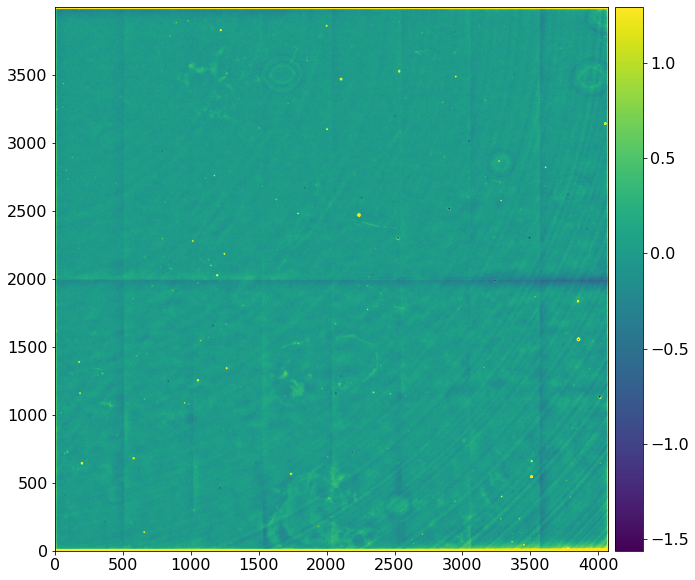

In [17]:
imshow2(flat_itl)

### Tree Ring Analysis: dT

In [18]:
ring_dx = tree_ring_tools(sensor='ITL',loc=0)
ring_dx.make_image(itl,'dT',fradius=130)

ring_dx.img_cut = myfilter(100*ring_dx.img_cut).astype(np.float32)
ring_dx.img     *= 100.

limits: -4.35e+00, 3.10e+00


/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2021_16/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0-ext/lib/python3.8/site-packages/skimage/measure/block.py:86: RuntimeWarning: Mean of empty slice
  return func(blocked, axis=tuple(range(image.ndim, blocked.ndim)),


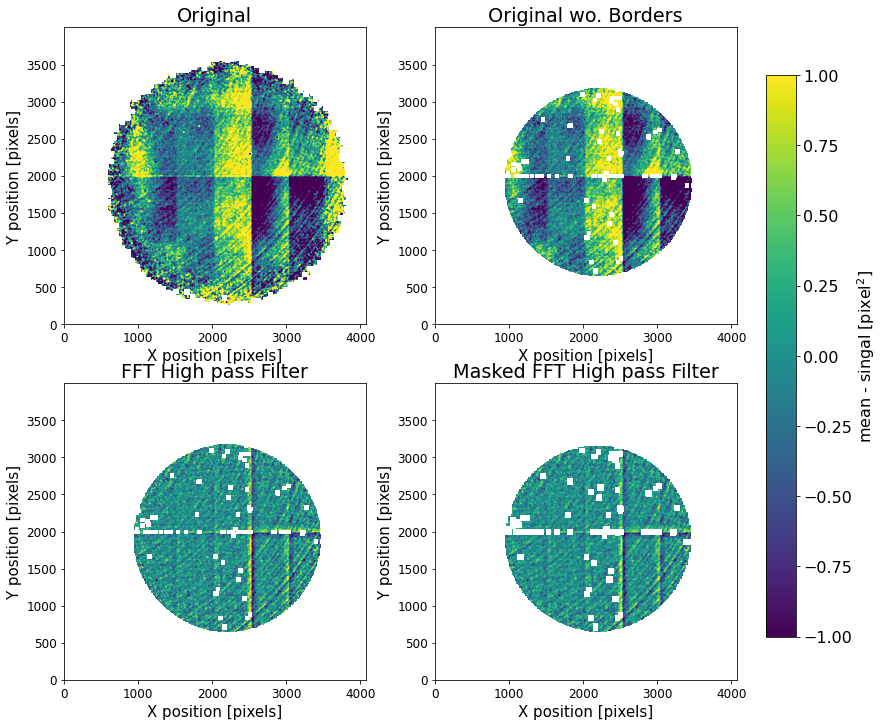

In [19]:
## always run in the following order
ring_dx.apply_high_freq_filter()
ring_dx.apply_gaussian_filter(downscale=2)
ring_dx.apply_mask(downscale=8,threshold=4.)

ring_dx.set_ylabel(r'mean - singal [pixel$^2$]')
ring_dx.set_levels([-1.,1.])
ring_dx.display_images()

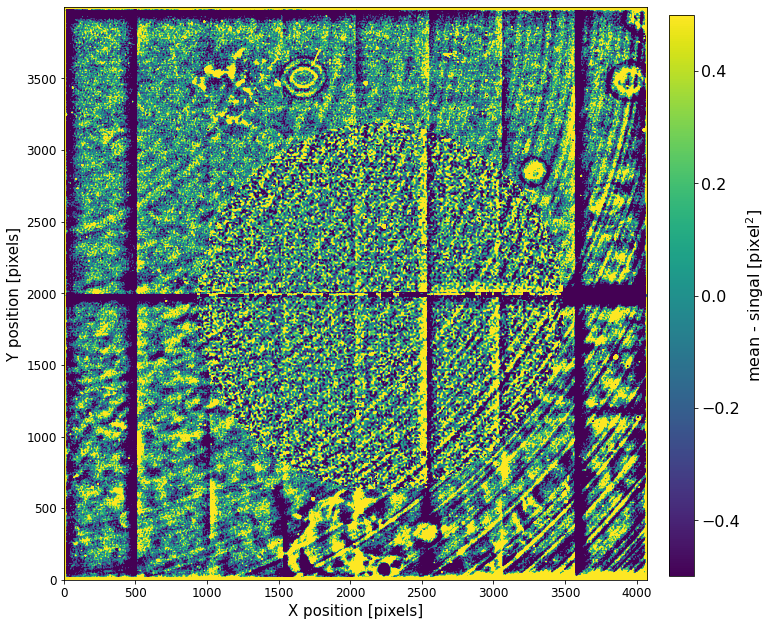

In [20]:
ring_dx.set_levels([-.5,.5])
ring_dx.plot_flat_sup(flat_itl*7.)

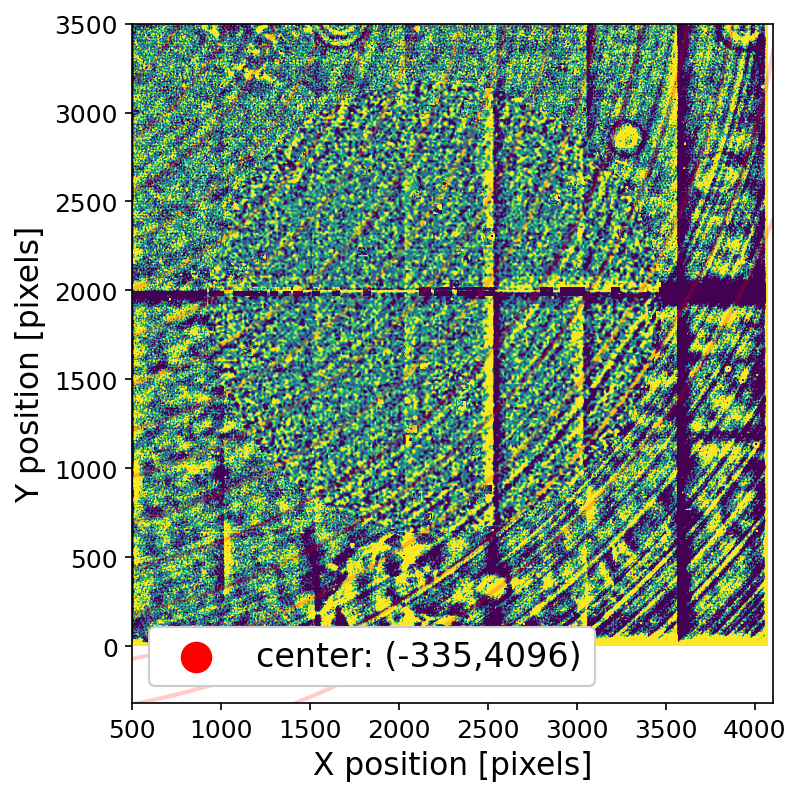

In [21]:
ring_dx.check_ccd_center_plot(ring_dx.diff2,ring_dx.xc,ring_dx.yc,xlims=(500,4100))

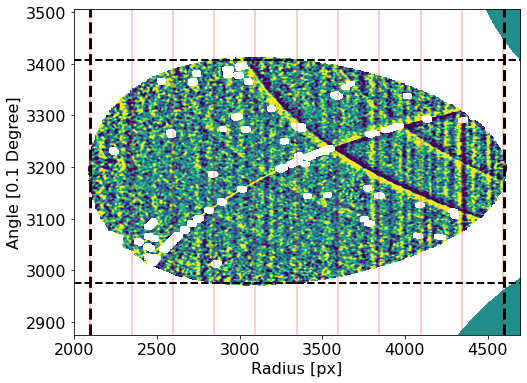

In [22]:
ring_dx.make_polar_transformation(rborder=35.)
ring_dx.check_polar_transfomartion()

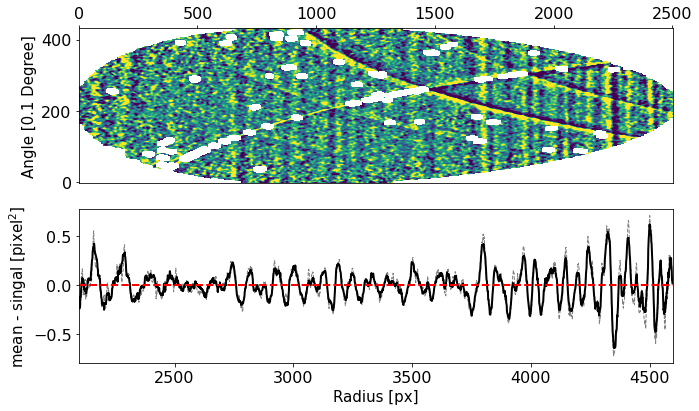

In [23]:
ring_dx.compute_signal()
ring_dx.plot_pannel_image_signal()

In [24]:
ring_dx.save_profile('dT')

saving: profiles/polar_ITL_dT.npy


### Tree Ring Analysis: Astrometric Shift, Radial Comp.

In [25]:
ring_dx = tree_ring_tools(sensor='ITL',loc=0)
ring_dx.make_image(itl,'dr',fradius=130)

ring_dx.img_cut = myfilter(100*ring_dx.img_cut,nsigma=5.).astype(np.float32)
ring_dx.img *= 100.

limits: -4.70e+00, 3.74e+00


/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2021_16/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0-ext/lib/python3.8/site-packages/skimage/measure/block.py:86: RuntimeWarning: Mean of empty slice
  return func(blocked, axis=tuple(range(image.ndim, blocked.ndim)),


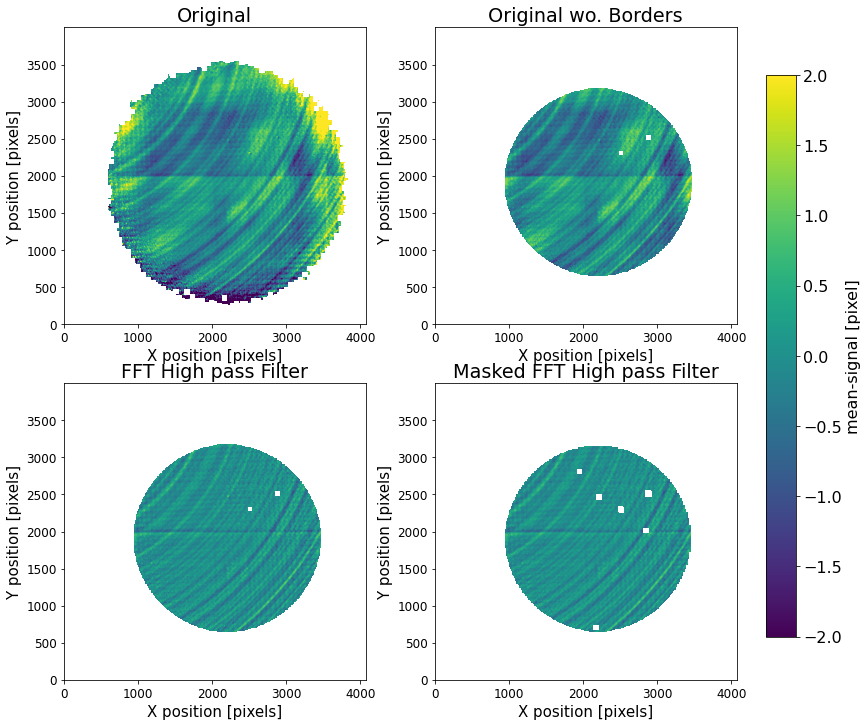

In [26]:
## always run in the following order
ring_dx.apply_high_freq_filter()
ring_dx.apply_gaussian_filter(downscale=2)
ring_dx.apply_mask(downscale=8,threshold=3.)

ring_dx.set_ylabel(r'mean-signal [pixel]')
ring_dx.set_levels([-2.,2.])
ring_dx.display_images()

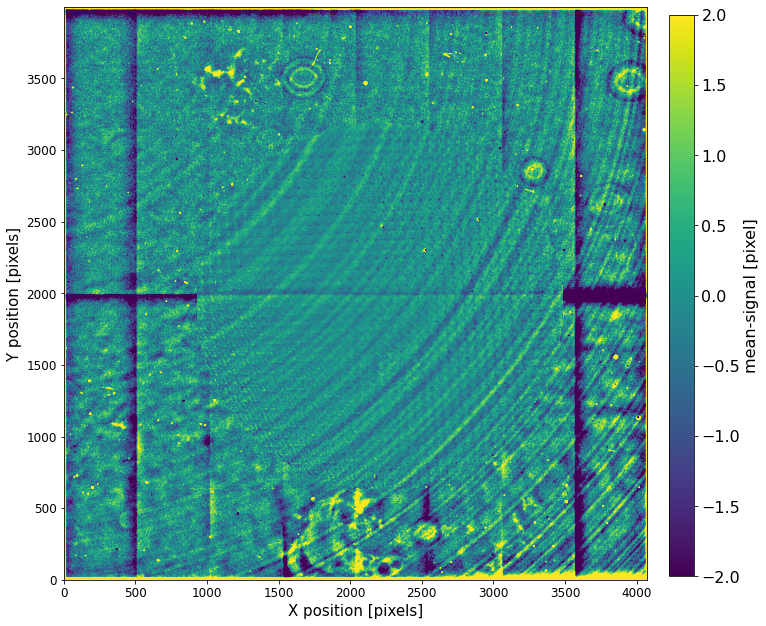

In [27]:
ring_dx.plot_flat_sup(flat_itl*10.)

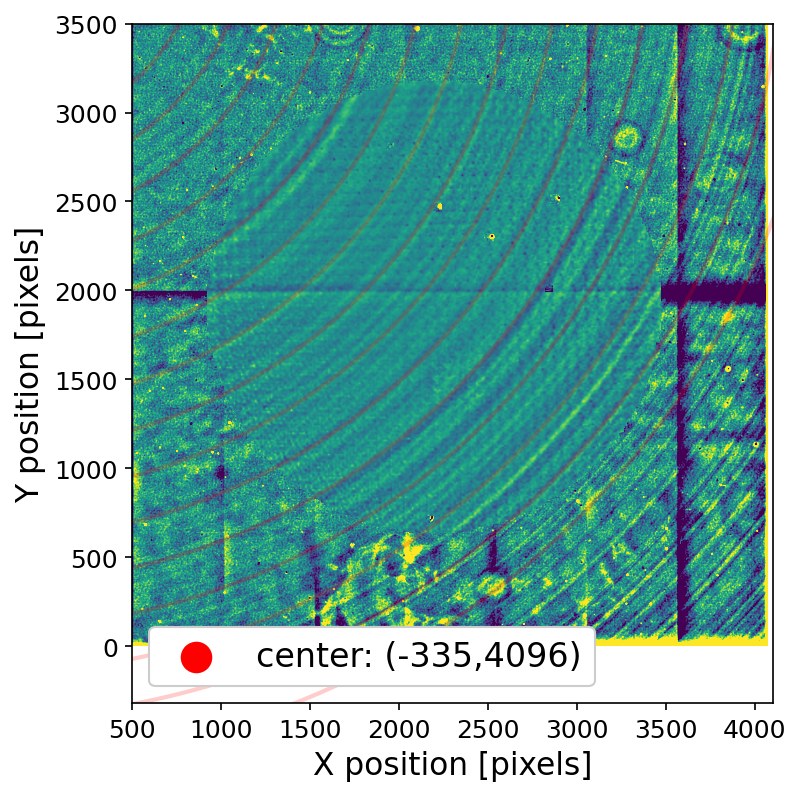

In [28]:
ring_dx.check_ccd_center_plot(ring_dx.diff2,ring_dx.xc,ring_dx.yc,xlims=(500,4100))

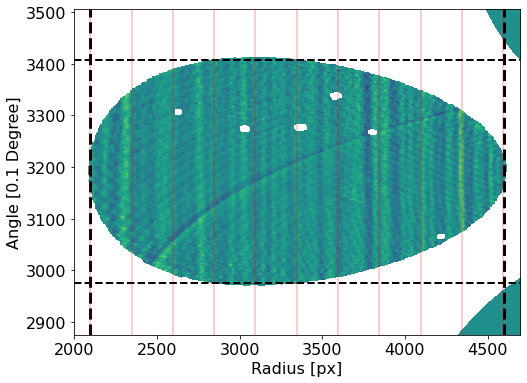

In [29]:
ring_dx.make_polar_transformation(rborder=35.)
ring_dx.check_polar_transfomartion()

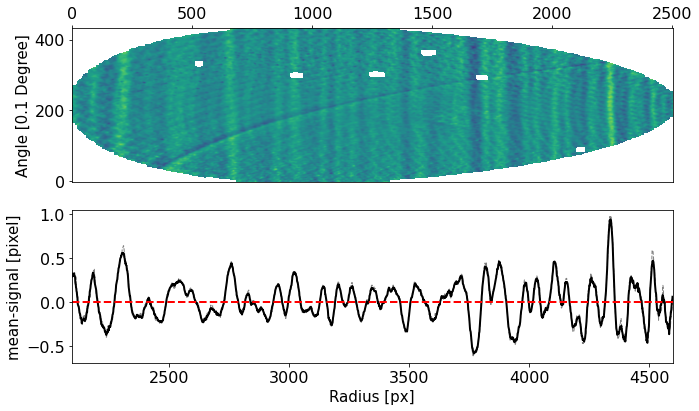

In [30]:
ring_dx.compute_signal()
ring_dx.plot_pannel_image_signal()

In [31]:
ring_dx.save_profile('dr')

saving: profiles/polar_ITL_dr.npy


In [32]:
ring_dx = tree_ring_tools(sensor='ITL',loc=0)
ring_dx.make_image(itl,'dtheta',fradius=130)

ring_dx.img_cut = myfilter(100*ring_dx.img_cut,nsigma=5.).astype(np.float32)
ring_dx.img *= 100.

limits: -5.49e+00, 4.49e+00


/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2021_16/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0-ext/lib/python3.8/site-packages/skimage/measure/block.py:86: RuntimeWarning: Mean of empty slice
  return func(blocked, axis=tuple(range(image.ndim, blocked.ndim)),


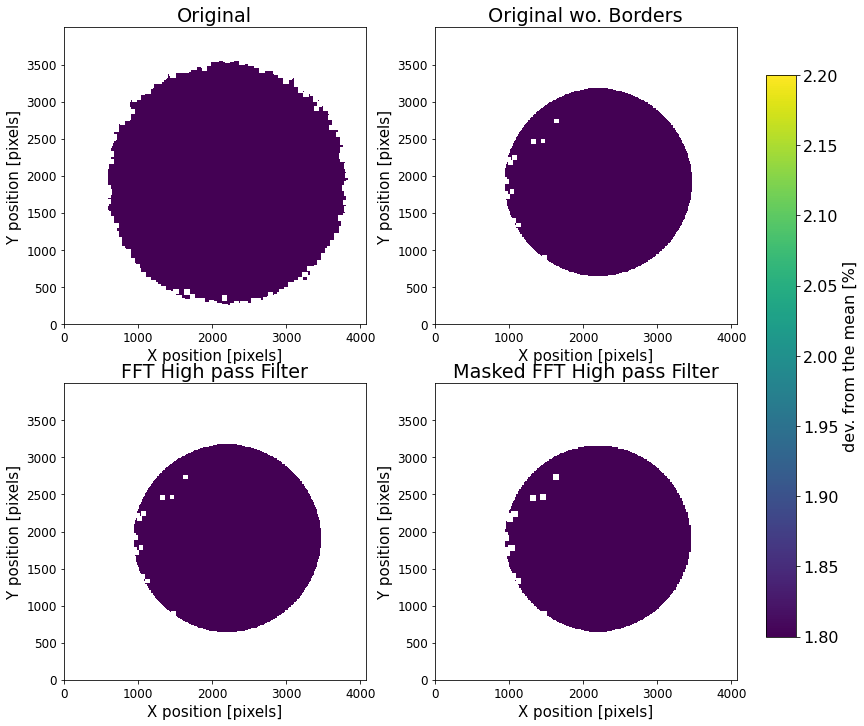

In [33]:
## always run in the following order
ring_dx.apply_high_freq_filter()
ring_dx.apply_gaussian_filter(downscale=2)
ring_dx.apply_mask(downscale=8,threshold=6.)

ring_dx.set_ylabel(r'dev. from the mean [%]')
ring_dx.set_levels([2.,2.])
ring_dx.display_images()

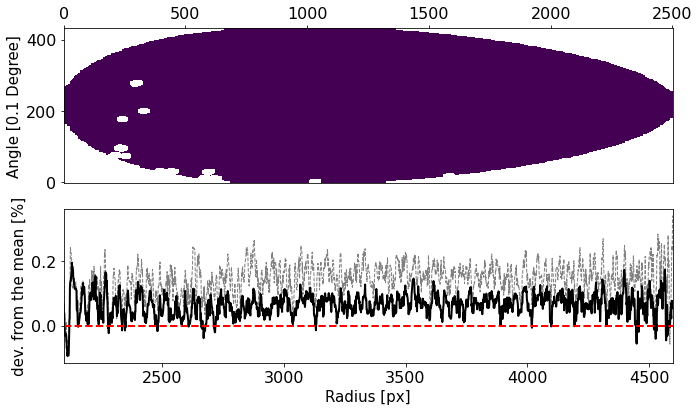

In [34]:
ring_dx.make_polar_transformation(rborder=35.)
# ring_dx.check_polar_transfomartion()
ring_dx.compute_signal()
ring_dx.plot_pannel_image_signal()

### Tree Ring Analysis: ellipticity gr

In [35]:
ring_dx = tree_ring_tools(sensor='ITL',loc=0)
ring_dx.make_image(itl,'dgr',fradius=130)
ring_dx.img_cut = myfilter(100*ring_dx.img_cut,nsigma=10.).astype(np.float32)
ring_dx.img *= 100.

limits: -6.49e-01, 5.88e-01


/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2021_16/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0-ext/lib/python3.8/site-packages/skimage/measure/block.py:86: RuntimeWarning: Mean of empty slice
  return func(blocked, axis=tuple(range(image.ndim, blocked.ndim)),


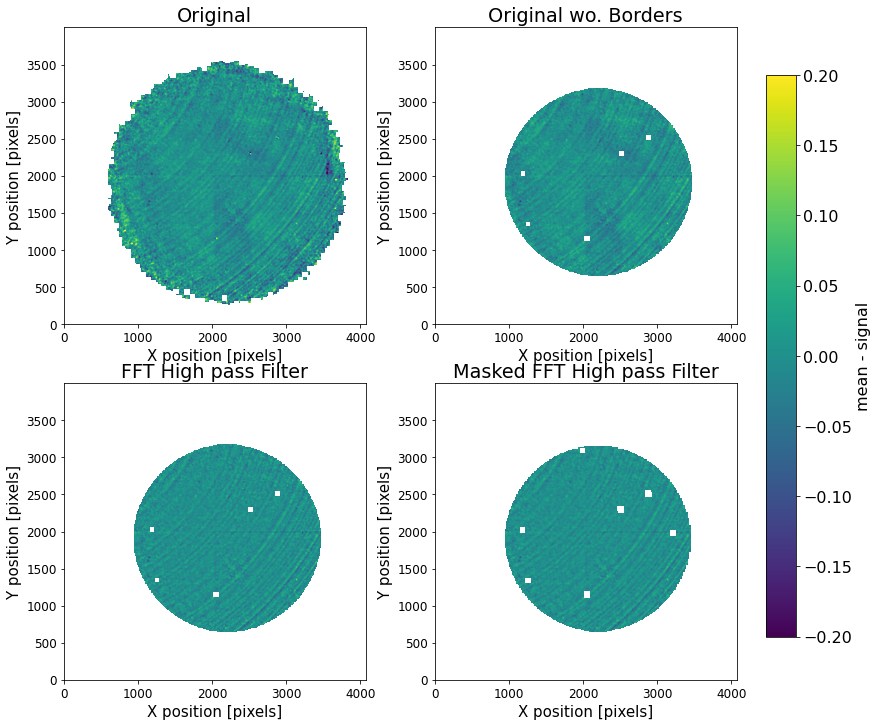

In [36]:
## always run in the following order
ring_dx.apply_high_freq_filter()
ring_dx.apply_gaussian_filter(downscale=2)
ring_dx.apply_mask(downscale=8, threshold=0.5)

ring_dx.set_ylabel(r'mean - signal')
ring_dx.set_levels([-.2,.2])
ring_dx.display_images()

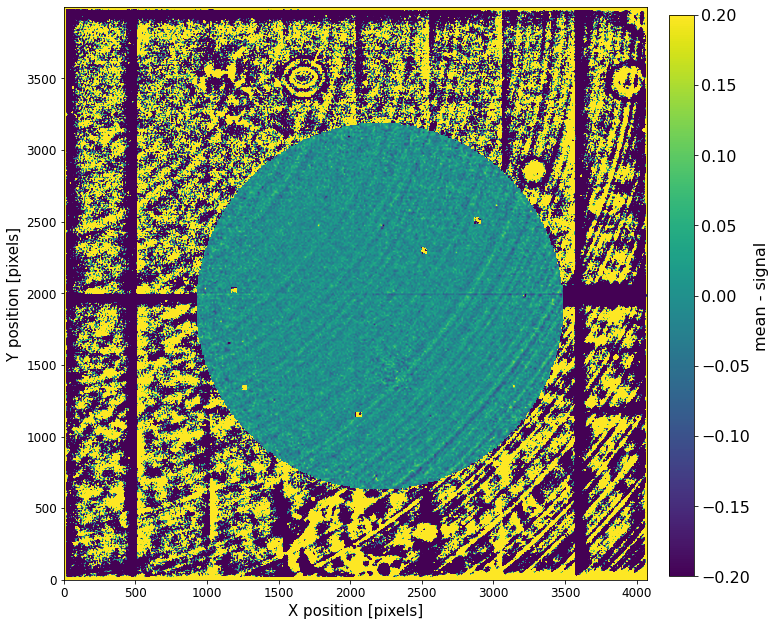

In [37]:
ring_dx.plot_flat_sup(flat_itl*10.)

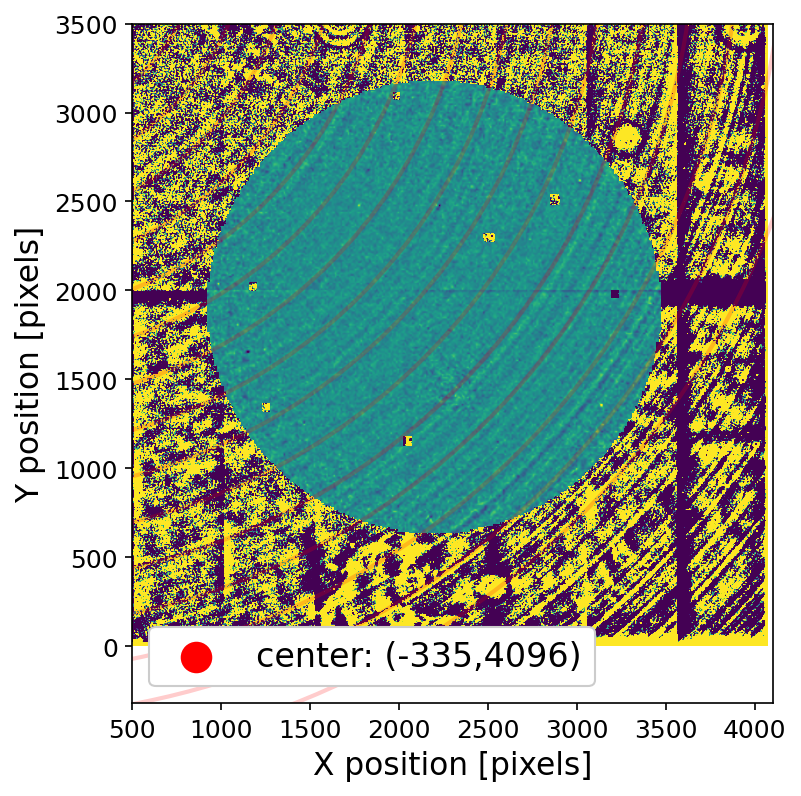

In [38]:
ring_dx.check_ccd_center_plot(ring_dx.diff2,ring_dx.xc,ring_dx.yc,xlims=(500,4100))

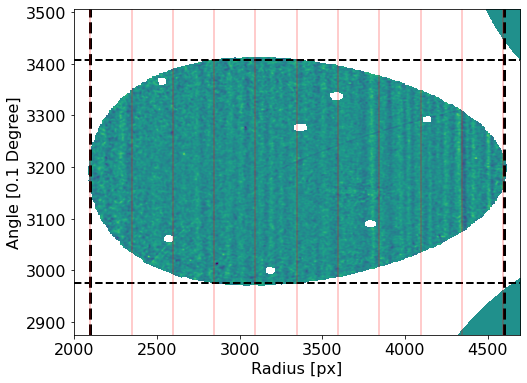

In [39]:
ring_dx.make_polar_transformation(rborder=35.)
ring_dx.check_polar_transfomartion()

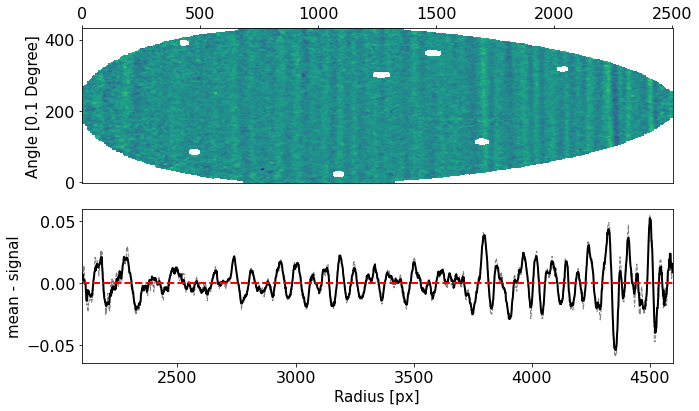

In [40]:
ring_dx.compute_signal()
ring_dx.plot_pannel_image_signal()

In [41]:
ring_dx.save_profile('dgr')

saving: profiles/polar_ITL_dgr.npy


## E2V

### Flat Field

In [42]:
from astropy.io import fits
hdulist = fits.open('tmp/%s_flat_diff.fits'%'e2v')
print(hdulist.info())
flat_etv = -100.*(hdulist[1].data).astype(float)

# hdulist = fits.open('tmp/%s_mask.fits'%'itl')
# mask_itl = hdulist[1].data

Filename: tmp/e2v_flat_diff.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   ()      
  1  FLATTENED     1 ImageHDU         8   (4096, 4004)   float32   
None


### Tree Ring Analysis: dT

In [43]:
ring_dx = tree_ring_tools(sensor='e2v',loc=3)
ring_dx.make_image(e2v,'dT',fradius=130)

ring_dx.img_cut = myfilter(100*ring_dx.img_cut,nsigma=3.).astype(np.float32)
ring_dx.img *= 100.

limits: -4.23e+00, 3.03e+00


/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2021_16/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0-ext/lib/python3.8/site-packages/skimage/measure/block.py:86: RuntimeWarning: Mean of empty slice
  return func(blocked, axis=tuple(range(image.ndim, blocked.ndim)),


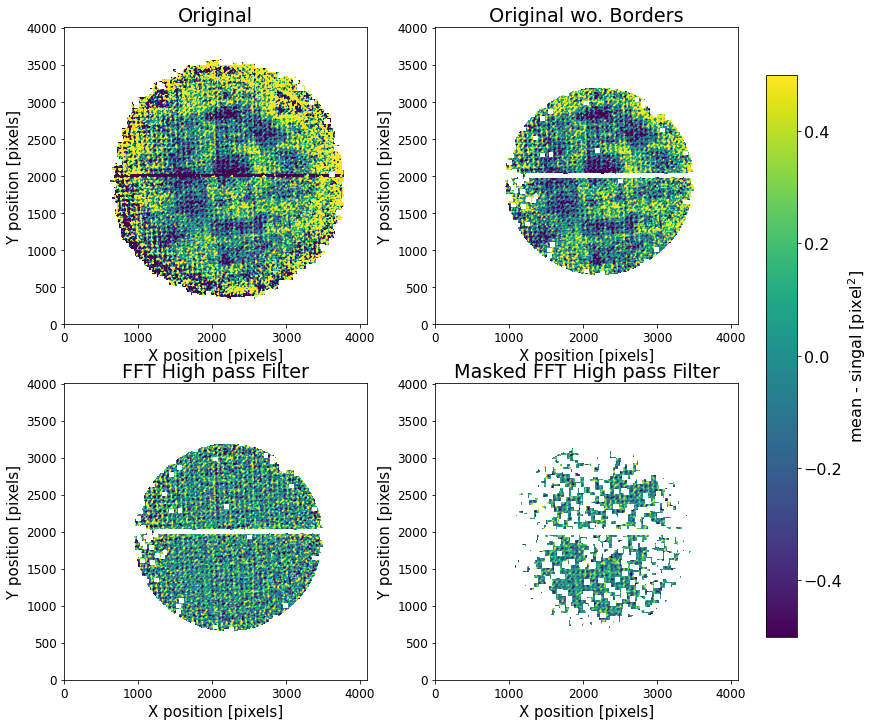

In [44]:
## always run in the following order
ring_dx.apply_high_freq_filter()
ring_dx.apply_gaussian_filter(downscale=2)
ring_dx.apply_mask(downscale=8,threshold=2.)

ring_dx.set_ylabel(r'mean - singal [pixel$^2$]')
ring_dx.set_levels([-0.5,0.5])
ring_dx.display_images()

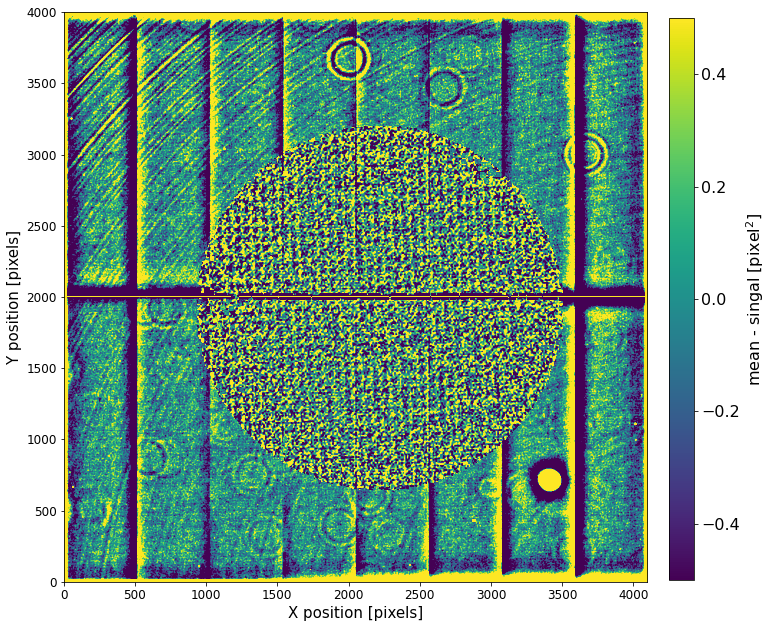

In [45]:
ring_dx.plot_flat_sup(flat_etv*7.)

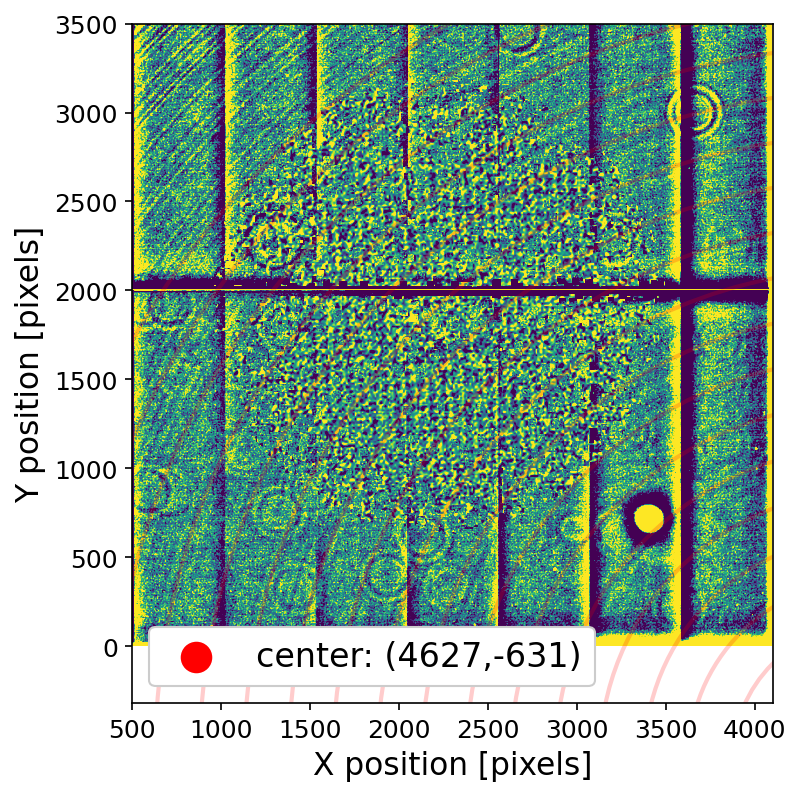

In [46]:
ring_dx.check_ccd_center_plot(ring_dx.diff2,ring_dx.xc,ring_dx.yc,xlims=(500,4100))

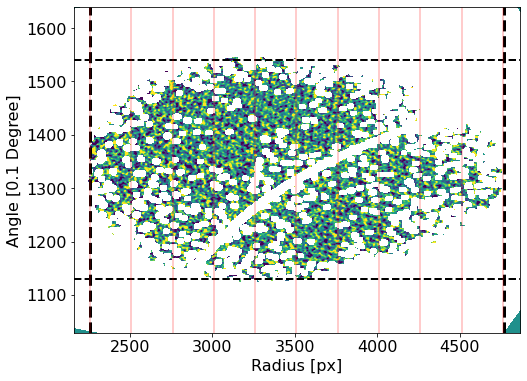

In [47]:
ring_dx.make_polar_transformation(rborder=35.)
ring_dx.check_polar_transfomartion()

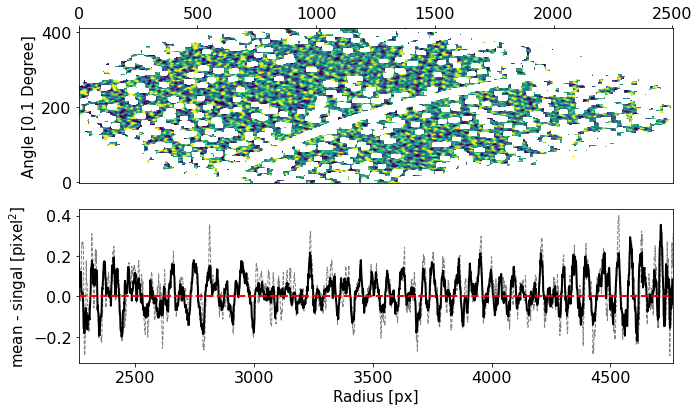

In [48]:
ring_dx.compute_signal()
ring_dx.plot_pannel_image_signal()

In [49]:
ring_dx.save_profile('dT')

saving: profiles/polar_e2v_dT.npy


### Tree Ring Analysis: Astrometric Shift, Radial Comp.

In [50]:
ring_dx = tree_ring_tools(sensor='e2v',loc=3)
ring_dx.make_image(e2v,'dr',fradius=130)

ring_dx.img_cut = myfilter(100*ring_dx.img_cut,nsigma=5.).astype(np.float32)
ring_dx.img *= 100.

limits: -4.84e+00, 3.89e+00


/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2021_16/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0-ext/lib/python3.8/site-packages/skimage/measure/block.py:86: RuntimeWarning: Mean of empty slice
  return func(blocked, axis=tuple(range(image.ndim, blocked.ndim)),


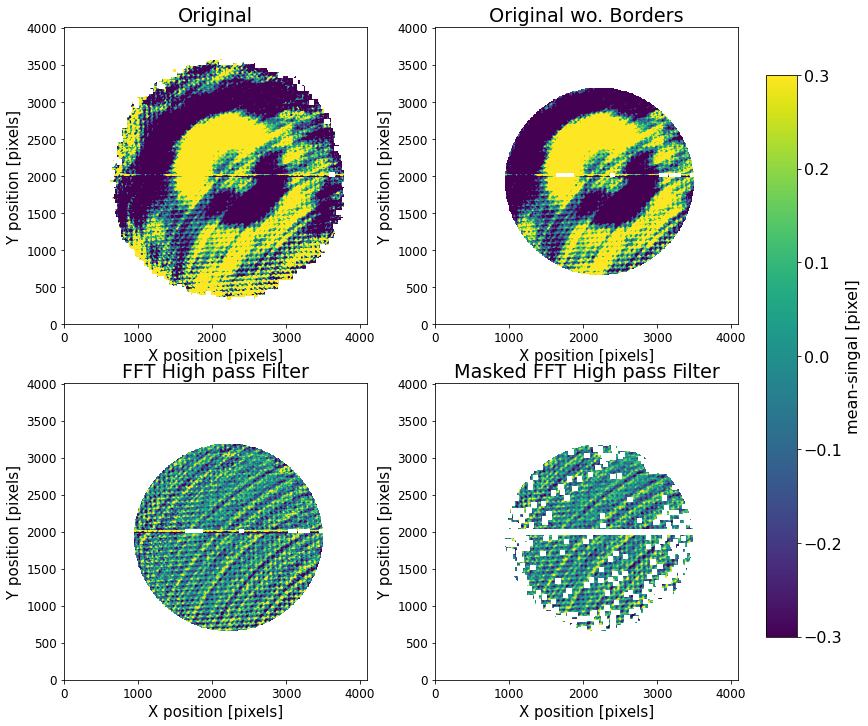

In [51]:
## always run in the following order
ring_dx.apply_high_freq_filter(smoothness=250)
ring_dx.apply_gaussian_filter(downscale=2)
ring_dx.apply_mask(downscale=8,threshold=1.)

ring_dx.set_ylabel(r'mean-singal [pixel]')
ring_dx.set_levels([-.3,.3])
ring_dx.display_images()

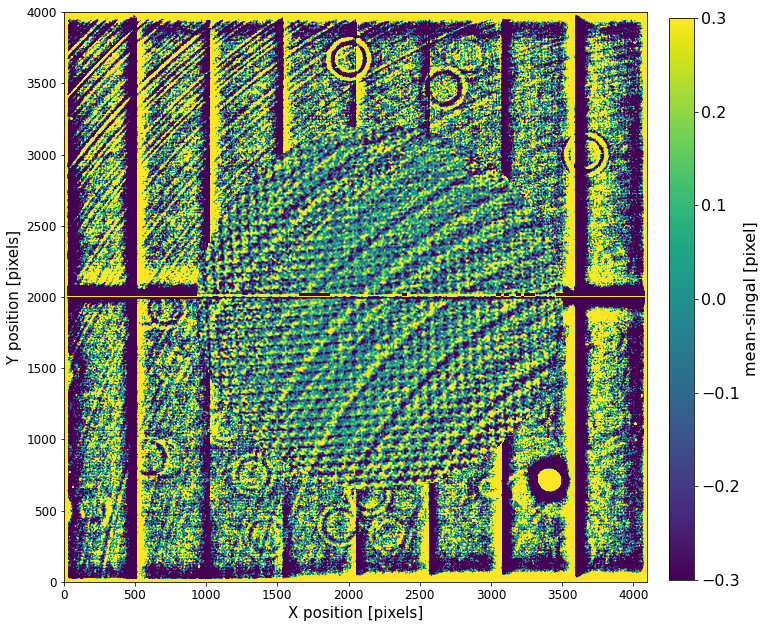

In [52]:
ring_dx.plot_flat_sup(flat_etv*10.)

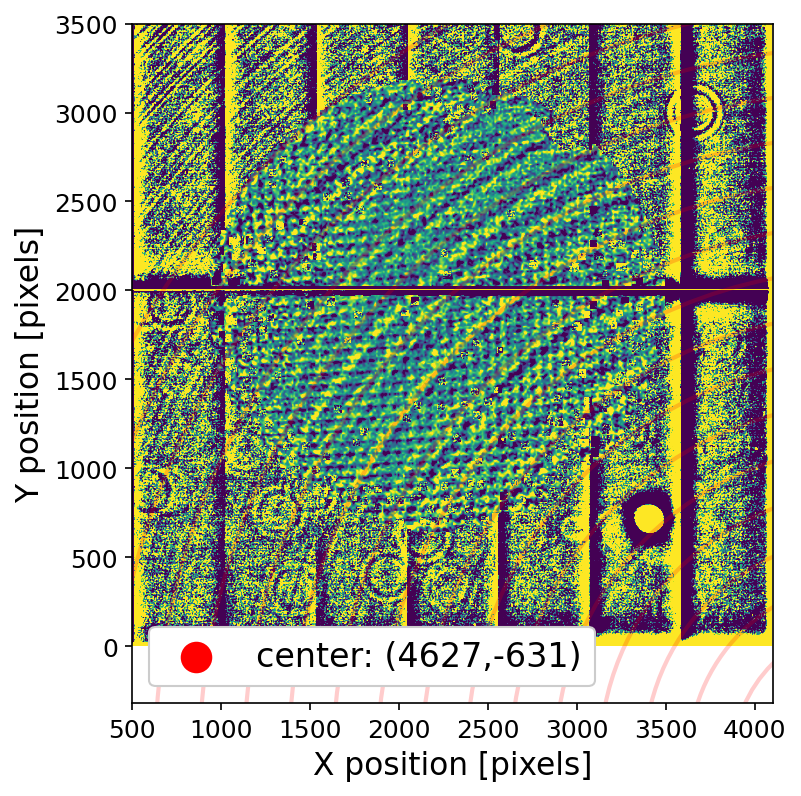

In [53]:
ring_dx.check_ccd_center_plot(ring_dx.diff2,ring_dx.xc,ring_dx.yc,xlims=(500,4100))

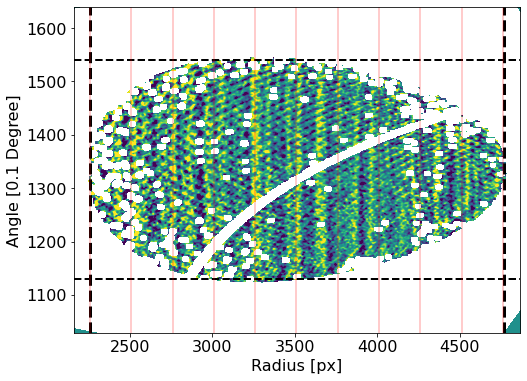

In [54]:
ring_dx.make_polar_transformation(rborder=35.)
ring_dx.check_polar_transfomartion()

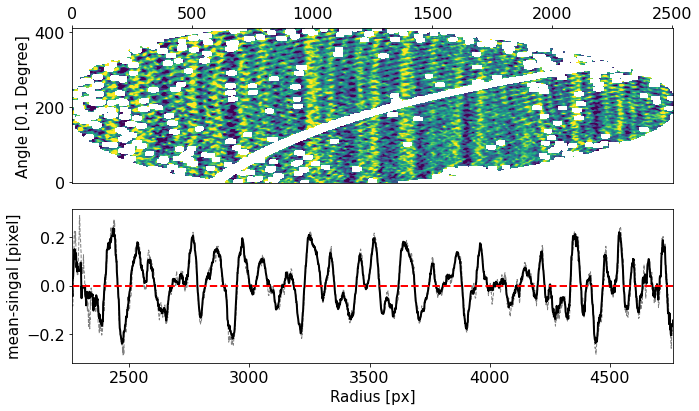

In [55]:
ring_dx.compute_signal()
ring_dx.plot_pannel_image_signal()

In [56]:
ring_dx.save_profile('dr')

saving: profiles/polar_e2v_dr.npy


In [18]:
ring_dx = tree_ring_tools(sensor='e2v',loc=3)
ring_dx.make_image(e2v,'dtheta',fradius=130)

ring_dx.img_cut = myfilter(100*ring_dx.img_cut,nsigma=5.).astype(np.float32)
ring_dx.img *= 100.

limits: -5.42e+00, 4.37e+00


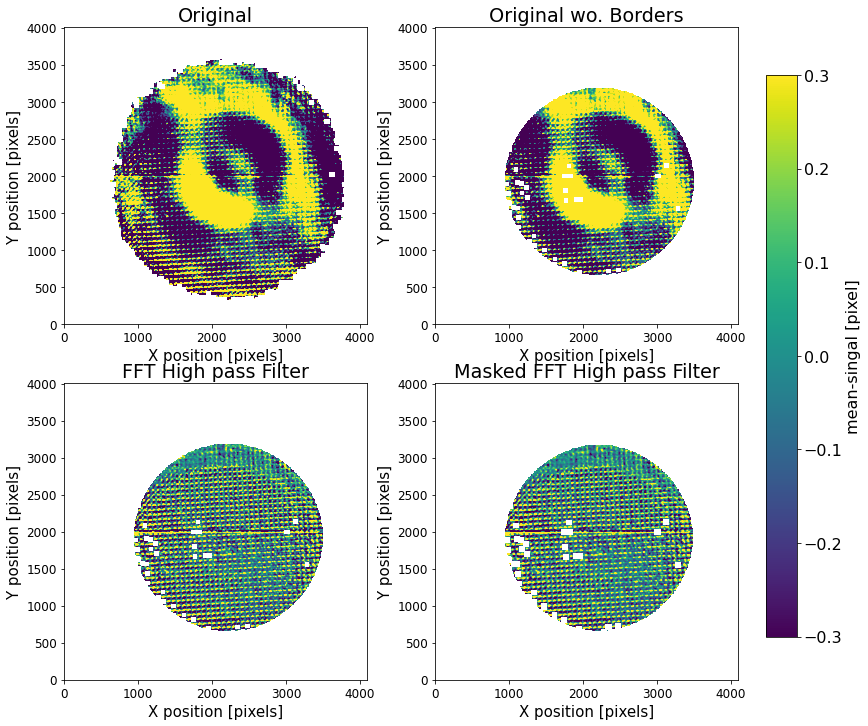

In [21]:
## always run in the following order
ring_dx.apply_high_freq_filter(smoothness=250)
ring_dx.apply_gaussian_filter(downscale=2)
ring_dx.apply_mask(downscale=8,threshold=5.)

ring_dx.set_ylabel(r'mean-singal [pixel]')
ring_dx.set_levels([-.3,.3])
ring_dx.display_images()

In [ ]:
# ring_dx.plot_flat_sup(flat_etv*10.)

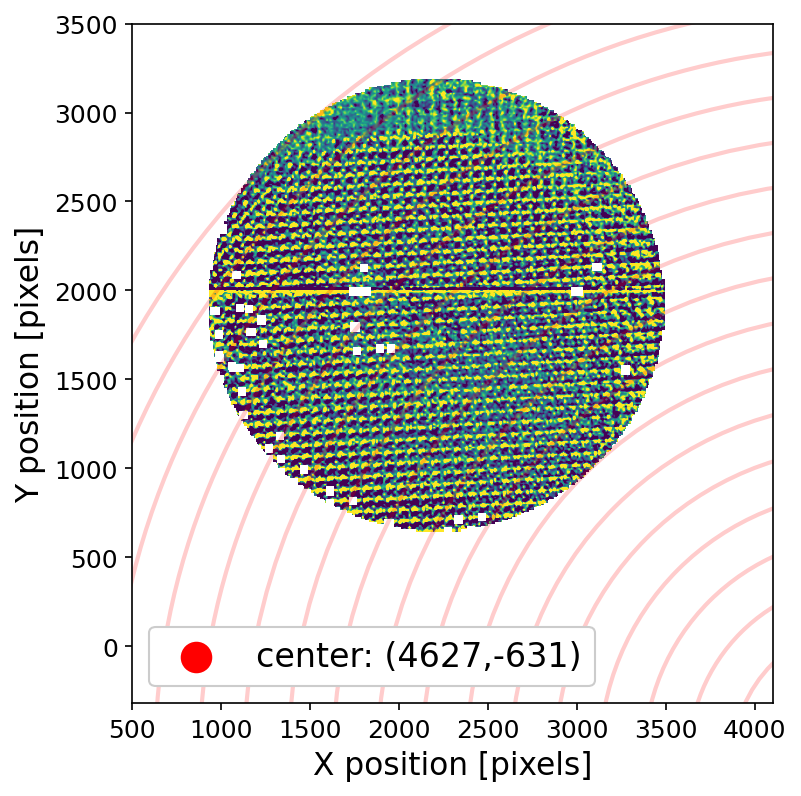

In [23]:
ring_dx.check_ccd_center_plot(ring_dx.diff2,ring_dx.xc,ring_dx.yc,xlims=(500,4100))

In [31]:
# ring_dx.xc = 4620.
# ring_dx.yc = -470.

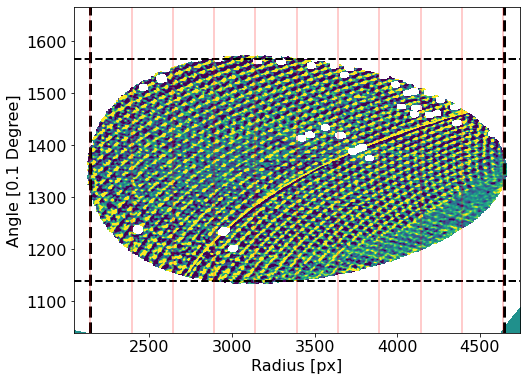

In [32]:
ring_dx.make_polar_transformation(rborder=35.)
ring_dx.check_polar_transfomartion()

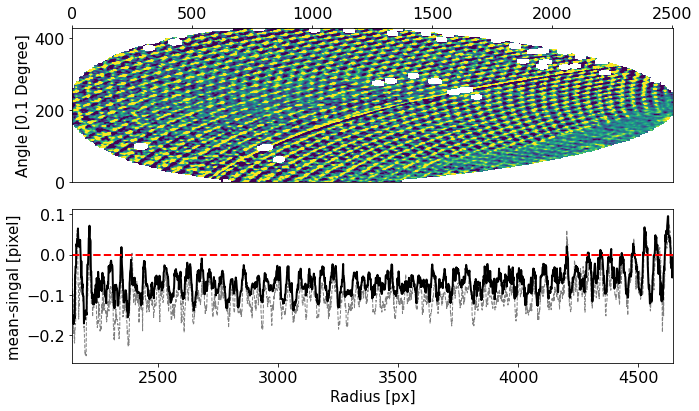

In [33]:
ring_dx.compute_signal()
ring_dx.plot_pannel_image_signal()

In [30]:
ring_dx.save_profile('dtheta')

saving: profiles/polar_e2v_dtheta.npy


In [57]:
ring_dx = tree_ring_tools(sensor='e2v',loc=3)
ring_dx.make_image(e2v,'dgr',fradius=130)
ring_dx.img_cut = myfilter(100*ring_dx.img_cut,nsigma=5.).astype(np.float32)
ring_dx.img *= 100.

limits: -5.52e-01, 4.53e-01


/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2021_16/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0-ext/lib/python3.8/site-packages/skimage/measure/block.py:86: RuntimeWarning: Mean of empty slice
  return func(blocked, axis=tuple(range(image.ndim, blocked.ndim)),


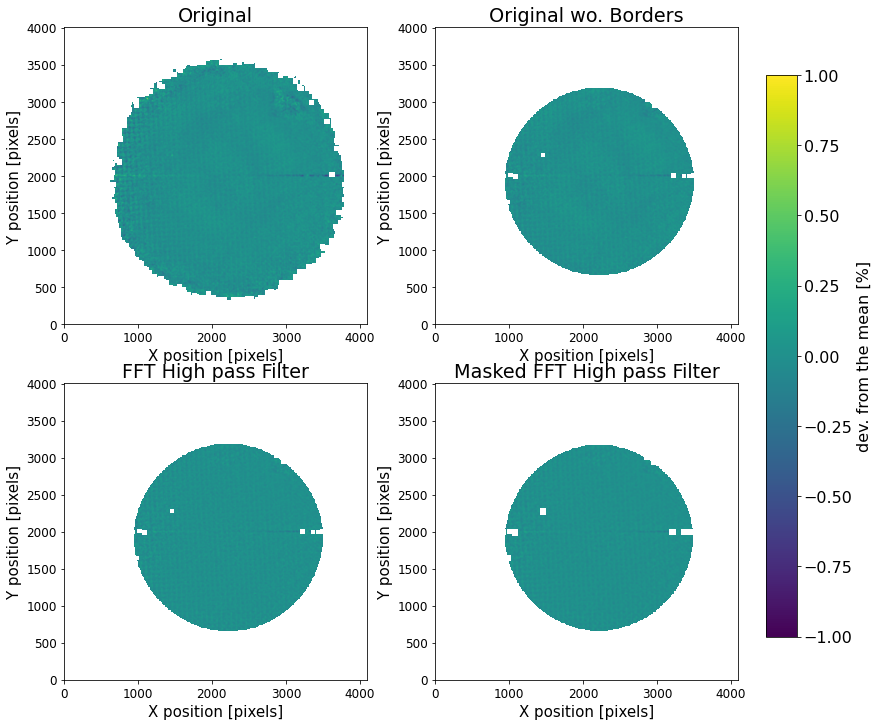

In [58]:
## always run in the following order
ring_dx.apply_high_freq_filter()
ring_dx.apply_gaussian_filter(downscale=2)
ring_dx.apply_mask(downscale=8, threshold=10.)

ring_dx.set_ylabel(r'dev. from the mean [%]')
ring_dx.set_levels([-1.,1.])
ring_dx.display_images()

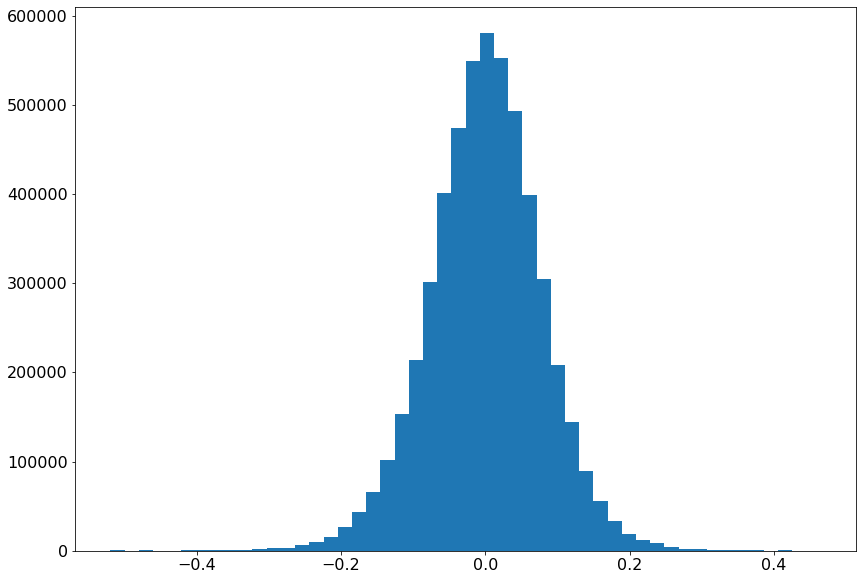

In [59]:
_ = plt.hist(ring_dx.diff[~np.isnan(ring_dx.diff)],bins=50)

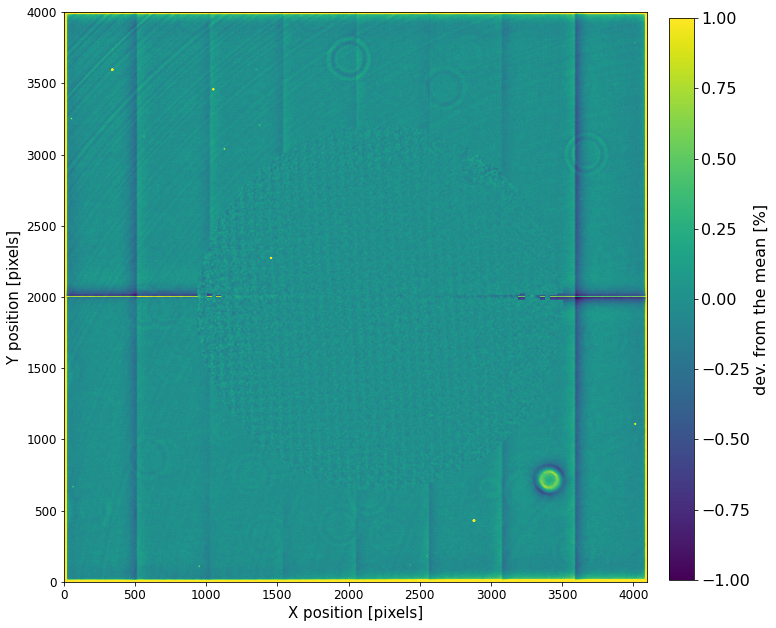

In [60]:
ring_dx.plot_flat_sup(flat_etv)

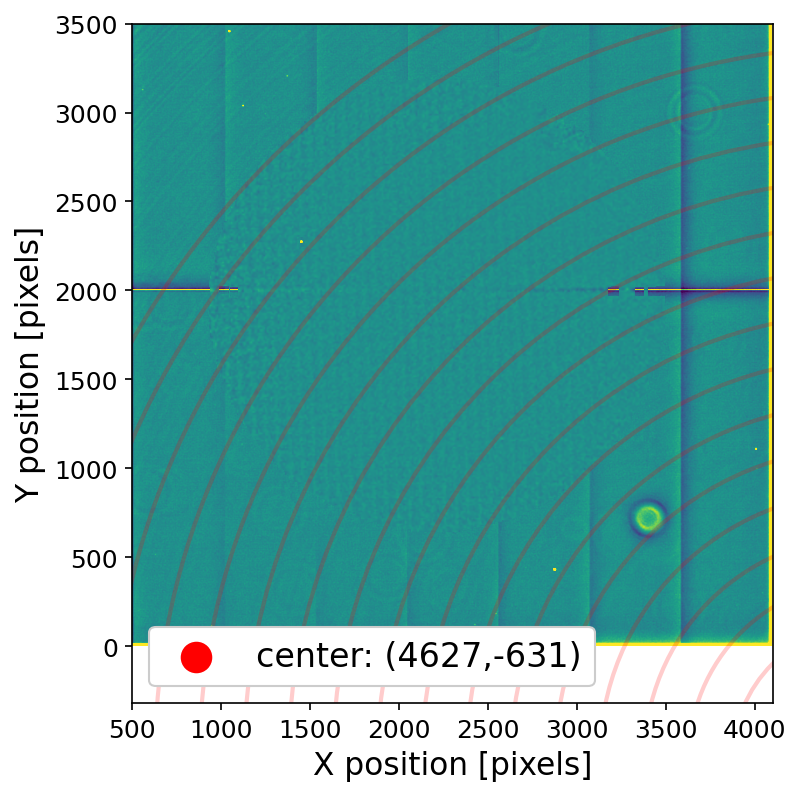

In [61]:
ring_dx.check_ccd_center_plot(ring_dx.diff2,ring_dx.xc,ring_dx.yc,xlims=(500,4100))

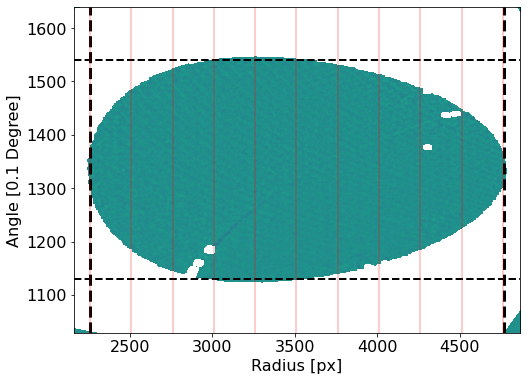

In [62]:
ring_dx.make_polar_transformation(rborder=35.)
ring_dx.check_polar_transfomartion()

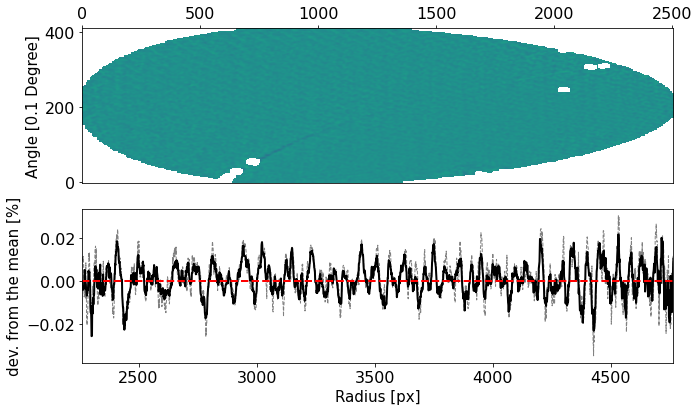

In [63]:
ring_dx.compute_signal()
ring_dx.plot_pannel_image_signal()

In [64]:
ring_dx.save_profile('dgr')

saving: profiles/polar_e2v_dgr.npy


In [65]:
break

SyntaxError: 'break' outside loop (<ipython-input-65-6aaf1f276005>, line 1)